# Trend VAE
This notebook demonstrates the training of a Linear Variational Autoencoder (VAE) to learn transformations from input climate data to corresponding forced responses, with BCE loss for reconstruction.

In [1]:
# Import necessary libraries
import pandas as pd
import pickle as pkl
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os, sys
import random
import warnings


from torch.utils.data import DataLoader

# Add utility paths
sys.path.append(os.path.join(os.getcwd(), 'utils'))

# Import utility functions
from utils.data_loading import *
from utils.data_processing import *
from utils.trend_vae_3 import *
from utils.animation import *
from utils.metrics import *
from utils.pipeline import *

# Enable autoreload
%reload_ext autoreload
%autoreload 2

# Suppress warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Define data path
current_dir = os.getcwd()
data_path = os.path.join(current_dir, 'data')
print(f"Data path: {data_path}")

Data path: /Users/lharriso/Documents/GitHub/gm4cs-l/data


In [2]:
# Use MPS / Cuda or CPU if none of the options are available
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
random.seed(42)

Using device: mps


In [3]:
# Load the data
filename = os.path.join(data_path, 'ssp585_time_series.pkl')
data, nan_mask = preprocess_data(data_path, filename)

Loading data from /Users/lharriso/Documents/GitHub/gm4cs-l/data/ssp585_time_series.pkl
Data loaded successfully.
Filtering data...


100%|██████████| 72/72 [00:00<00:00, 47805.90it/s]

Data filtered. Kept 34 models
Creating NaN mask...



100%|██████████| 34/34 [00:01<00:00, 17.52it/s]

NaN mask created.
Masking out NaN values...



100%|██████████| 34/34 [00:01<00:00, 24.95it/s]

NaN values masked out.
Reshaping data...



100%|██████████| 34/34 [00:03<00:00,  9.56it/s]

Data reshaped.
Adding the forced response to the data...



100%|██████████| 34/34 [00:03<00:00,  8.92it/s]

Forced response added.
Removing NaN values from the grid...



100%|██████████| 34/34 [00:01<00:00, 25.18it/s]

NaN values removed.


In [4]:
# Randomly select and keep the data corresponding to n models
n_models = 34
model_keys = random.sample(data.keys(), n_models)
data = {key: value for key,value in data.items() if key in model_keys}

/var/folders/9v/q6t68ds12f9c4dgn9gnwzrmr0000gn/T/ipykernel_21788/1611098142.py:3: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  model_keys = random.sample(data.keys(), n_models)


In [5]:
# Select one of the models randomly for testing and the rest for training according to the leave-one-out strategy
test_model = random.choice(list(data.keys()))
train_models = [model for model in data.keys() if model != test_model]

# Create the training and testing datasets
train_data = {model: data[model] for model in train_models}
test_data = {test_model: data[test_model]}

print(f"Training models: {train_models}")
print(f"Testing model: {test_model}")

Training models: ['ICON-ESM-LR', 'EC-Earth3', 'CMCC-CM2-SR5', 'ACCESS-CM2', 'CESM2', 'CNRM-ESM2-1', 'IPSL-CM6A-LR', 'GISS-E2-2-G', 'CNRM-CM6-1', 'CanESM5-1', 'E3SM-2-0-NARRM', 'HadGEM3-GC31-LL', 'MIROC-ES2L', 'GISS-E2-1-H', 'E3SM-2-0', 'GISS-E2-1-G', 'EC-Earth3-Veg', 'HadGEM3-GC31-MM', 'FGOALS-g3', 'E3SM-1-0', 'MPI-ESM1-2-HR', 'CanESM5', 'CAS-ESM2-0', 'MIROC6', 'NESM3', 'GISS-E2-2-H', 'MPI-ESM1-2-LR', 'AWI-CM-1-1-MR', 'UKESM1-0-LL', 'NorCPM1', 'INM-CM5-0', 'MRI-ESM2-0', 'CESM2-FV2']
Testing model: ACCESS-ESM1-5


In [6]:
center = True
normalized_train_data, normalized_test_data, _, _ = normalize_data(train_data, test_data, center=center)


Normalizing data...


100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

Data normalization completed.


In [7]:
# Print the distribution of the data
# Flatten the data for analysis
# flattened_data = np.concatenate([np.ravel(array) for model in normalized_train_data.values() for array in model.values()])
# print("Flattened the data")
# # Plot the distribution of the data
# plt.figure(figsize=(10, 6))
# sns.histplot(flattened_data, bins=50, kde=False)
# plt.title('Distribution of Flattened Data')
# plt.xlabel('Value')
# plt.ylabel('Frequency')
# plt.show()

In [8]:
# # Flatten the normalized_test_data for analysis
# flattened_test_data = np.concatenate([np.ravel(array) for model in normalized_test_data.values() for array in model.values()])

# # Plot the distribution of the flattened normalized_test_data
# plt.figure(figsize=(10, 6))
# sns.histplot(flattened_test_data, bins=50, kde=False)
# plt.title('Distribution of Normalized Test Data')
# plt.xlabel('Value')
# plt.ylabel('Frequency')
# plt.show()

In [9]:
# Create dataset for the linear VAE
train_dataset = ClimateDataset(normalized_train_data)
test_dataset = ClimateDataset(normalized_test_data)

# Create dataloaders
batch_size = 16  # Higher batch size for linear VAE
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Print dataset sizes
print(f'Training dataset size: {len(train_dataset)}')
print(f'Testing dataset size: {len(test_dataset)}')

# Check the shape of the data
sample = next(iter(train_loader))
print(f"Input shape: {sample['input'].shape}")
print(f"Output shape: {sample['output'].shape}")

Creating datasets...


Processing models: 100%|██████████| 33/33 [00:00<00:00, 96791.63it/s]


Creating datasets...


Processing models: 100%|██████████| 1/1 [00:00<00:00, 18808.54it/s]


Training dataset size: 677
Testing dataset size: 40
Input shape: torch.Size([16, 165, 6523])
Output shape: torch.Size([16, 165, 6523])


In [10]:
# Initialize the Linear VAE model
# Calculate input dimension from flattened sample
sample = next(iter(train_loader))

# Set VAE parameters
hidden_dim = 128 # Increased for better representation
feat_dim = 6523
latent_dim = 64 # Intermediate layer size
z_dim = 5 # Actual latent space dimension
trend_poly = 2
seq_len, _ = sample['input'].shape[1:]
print(f"The sequence length is {seq_len}")
# beta = 0.001      # Weight for KL divergence term -- not used in this version

# Create the model
vae_model = Trend_Vae(
    seq_len=seq_len,
    feat_dim=feat_dim,
    hidden_dim=hidden_dim,
    latent_dim=latent_dim,
    z_dim=z_dim,
    trend_poly=trend_poly,
    use_residual_conn=True,
    device=device,
).to(device)

# Print model summary
print("\nTrend VAE Model Architecture:")
print(vae_model)
print(f"\nTotal parameters: {sum(p.numel() for p in vae_model.parameters() if p.requires_grad):,}")

The sequence length is 165

Trend VAE Model Architecture:
Trend_Vae(
  (encoder): TrendVAEEncoder(
    (encoder): Sequential(
      (0): Conv1d(6523, 128, kernel_size=(3,), stride=(2,), padding=(1,))
      (1): ReLU()
      (2): Conv1d(128, 64, kernel_size=(3,), stride=(2,), padding=(1,))
      (3): ReLU()
      (4): Flatten(start_dim=1, end_dim=-1)
    )
    (z_mean): Linear(in_features=2688, out_features=5, bias=True)
    (z_log_var): Linear(in_features=2688, out_features=5, bias=True)
  )
  (decoder): TrendVAEDecoder(
    (level_model): LevelModel(
      (level_dense1): Linear(in_features=5, out_features=6523, bias=True)
      (level_dense2): Linear(in_features=6523, out_features=6523, bias=True)
      (relu): ReLU()
    )
    (trend_layer): TrendLayer(
      (trend_dense1): Linear(in_features=5, out_features=13046, bias=True)
      (trend_dense2): Linear(in_features=13046, out_features=13046, bias=True)
    )
    (residual_conn): ResidualConnection(
      (fc): Linear(in_features=5

In [11]:
# Train the VAE
epochs = 500
losses = []

optimizer = torch.optim.Adam(vae_model.parameters(), lr=3e-4) # Weight decay is not used in this version (was weight_decay=1e-5)

losses = train_vae(vae_model, train_loader, optimizer, epochs=epochs, device=device)

  0%|          | 1/500 [00:08<1:10:05,  8.43s/it]

Epoch 1, Loss: 230044.5490


  2%|▏         | 11/500 [01:12<48:14,  5.92s/it] 

Epoch 11, Loss: 54416.2903


  4%|▍         | 21/500 [02:10<45:56,  5.76s/it]

Epoch 21, Loss: 31557.3964


  6%|▌         | 31/500 [03:08<45:14,  5.79s/it]

Epoch 31, Loss: 19256.1370


  8%|▊         | 41/500 [04:14<50:06,  6.55s/it]

Epoch 41, Loss: 16156.4303


 10%|█         | 51/500 [05:15<43:39,  5.83s/it]

Epoch 51, Loss: 14920.0789


 12%|█▏        | 61/500 [06:12<41:53,  5.73s/it]

Epoch 61, Loss: 14178.0326


 14%|█▍        | 71/500 [07:11<41:01,  5.74s/it]

Epoch 71, Loss: 13242.3804


 16%|█▌        | 81/500 [08:09<40:17,  5.77s/it]

Epoch 81, Loss: 12703.9435


 18%|█▊        | 91/500 [09:09<41:01,  6.02s/it]

Epoch 91, Loss: 11926.3836


 20%|██        | 101/500 [10:09<39:32,  5.95s/it]

Epoch 101, Loss: 11593.1438


 22%|██▏       | 111/500 [11:08<38:24,  5.92s/it]

Epoch 111, Loss: 11020.6881


 24%|██▍       | 121/500 [12:08<37:54,  6.00s/it]

Epoch 121, Loss: 10365.9247


 26%|██▌       | 131/500 [13:10<37:24,  6.08s/it]

Epoch 131, Loss: 10280.5847


 28%|██▊       | 141/500 [14:13<39:16,  6.56s/it]

Epoch 141, Loss: 9887.3776


 30%|███       | 151/500 [15:15<35:25,  6.09s/it]

Epoch 151, Loss: 9753.5913


 32%|███▏      | 161/500 [16:17<34:09,  6.05s/it]

Epoch 161, Loss: 9682.3194


 34%|███▍      | 171/500 [17:20<33:26,  6.10s/it]

Epoch 171, Loss: 9539.4037


 36%|███▌      | 181/500 [18:23<31:49,  5.99s/it]

Epoch 181, Loss: 10140.6500


 38%|███▊      | 191/500 [19:26<34:20,  6.67s/it]

Epoch 191, Loss: 9107.1742


 40%|████      | 201/500 [38:16<2:10:54, 26.27s/it]  

Epoch 201, Loss: 9038.4230


 42%|████▏     | 211/500 [39:36<40:54,  8.49s/it]  

Epoch 211, Loss: 9537.5272


 44%|████▍     | 221/500 [41:02<30:24,  6.54s/it]  

Epoch 221, Loss: 8918.1566


 46%|████▌     | 231/500 [42:00<25:46,  5.75s/it]

Epoch 231, Loss: 8925.5138


 48%|████▊     | 241/500 [42:58<24:56,  5.78s/it]

Epoch 241, Loss: 8892.1463


 50%|█████     | 251/500 [43:56<23:56,  5.77s/it]

Epoch 251, Loss: 8993.2158


 52%|█████▏    | 261/500 [44:55<23:22,  5.87s/it]

Epoch 261, Loss: 9034.8257


 54%|█████▍    | 271/500 [45:54<22:20,  5.85s/it]

Epoch 271, Loss: 8823.6356


 56%|█████▌    | 281/500 [46:53<21:40,  5.94s/it]

Epoch 281, Loss: 8462.5089


 58%|█████▊    | 291/500 [47:55<21:24,  6.15s/it]

Epoch 291, Loss: 8393.1902


 60%|██████    | 301/500 [48:56<19:53,  6.00s/it]

Epoch 301, Loss: 8428.1764


 62%|██████▏   | 311/500 [49:58<19:15,  6.12s/it]

Epoch 311, Loss: 8709.9286


 64%|██████▍   | 321/500 [50:56<17:12,  5.77s/it]

Epoch 321, Loss: 8206.8804


 66%|██████▌   | 331/500 [51:56<16:32,  5.87s/it]

Epoch 331, Loss: 8353.3181


 68%|██████▊   | 341/500 [52:57<15:36,  5.89s/it]

Epoch 341, Loss: 8099.7393


 70%|███████   | 351/500 [53:57<14:44,  5.93s/it]

Epoch 351, Loss: 8696.0283


 72%|███████▏  | 361/500 [54:56<13:28,  5.82s/it]

Epoch 361, Loss: 8059.9281


 74%|███████▍  | 371/500 [55:55<12:27,  5.79s/it]

Epoch 371, Loss: 8497.5905


 76%|███████▌  | 381/500 [56:54<11:32,  5.82s/it]

Epoch 381, Loss: 8199.8044


 78%|███████▊  | 391/500 [57:52<10:33,  5.81s/it]

Epoch 391, Loss: 8122.4073


 80%|████████  | 401/500 [58:52<09:49,  5.95s/it]

Epoch 401, Loss: 7962.0853


 82%|████████▏ | 411/500 [59:50<08:40,  5.85s/it]

Epoch 411, Loss: 8199.6533


 84%|████████▍ | 421/500 [1:00:51<08:32,  6.49s/it]

Epoch 421, Loss: 7971.6198


 86%|████████▌ | 431/500 [1:01:53<06:55,  6.02s/it]

Epoch 431, Loss: 8011.1715


 88%|████████▊ | 441/500 [1:02:57<06:35,  6.70s/it]

Epoch 441, Loss: 7985.1347


 90%|█████████ | 451/500 [1:04:05<05:33,  6.81s/it]

Epoch 451, Loss: 8282.6231


 92%|█████████▏| 461/500 [1:05:02<03:43,  5.74s/it]

Epoch 461, Loss: 7991.7699


 94%|█████████▍| 471/500 [1:05:59<02:45,  5.71s/it]

Epoch 471, Loss: 7900.4765


 96%|█████████▌| 481/500 [1:06:56<01:48,  5.70s/it]

Epoch 481, Loss: 7969.1690


 98%|█████████▊| 491/500 [1:07:53<00:51,  5.70s/it]

Epoch 491, Loss: 7871.7704


100%|██████████| 500/500 [1:08:45<00:00,  8.25s/it]


## Save the model

In [12]:
# Save the model
model_path = os.path.join(current_dir, 'models', 'trend_vae_model.pth')
save_model(vae_model, model_path)

Model saved to /Users/lharriso/Documents/GitHub/gm4cs-l/models/trend_vae_model.pth


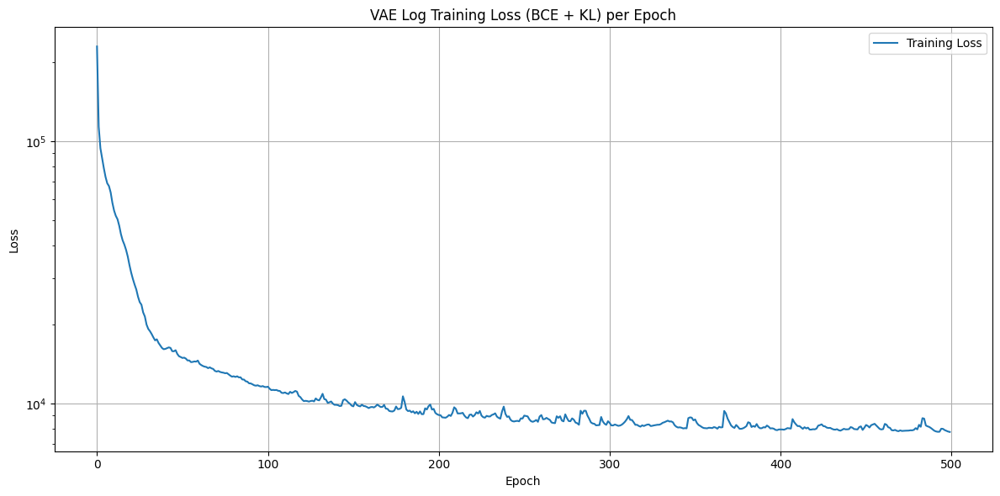

Final loss value: 7791.778169


In [13]:
# Plot the training loss
plt.figure(figsize=(12, 6))
plt.plot(losses, label='Training Loss')
plt.legend()
plt.title('VAE Log Training Loss (BCE + KL) per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.yscale('log')  # Using log scale to better visualize the decreasing loss
plt.tight_layout()
plt.show()

# Print the final loss value
print(f"Final loss value: {losses[-1]:.6f}")

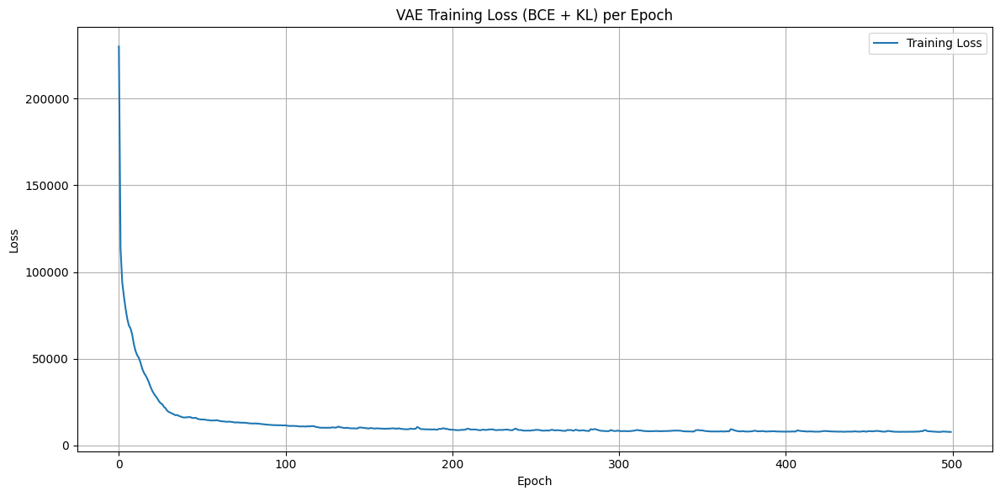

Final loss value: 7791.778169


In [14]:
# Plot the training loss
plt.figure(figsize=(12, 6))
plt.plot(losses, label='Training Loss')
plt.legend()
plt.title('VAE Training Loss (BCE + KL) per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
# plt.yscale('log')  # Using log scale to better visualize the decreasing loss
plt.tight_layout()
plt.show()

# Print the final loss value
print(f"Final loss value: {losses[-1]:.6f}")

# Random Run Selection and Inference
Now we'll select some random runs from the test model and use our trained VAE model to make predictions.

In [15]:
# Set the number of random runs to select
num_runs = 5

# Get the available runs for the test model (excluding forced_response)
test_runs = [run for run in normalized_test_data[test_model].keys() if run != 'forced_response']
print(f"Available runs for {test_model}: {test_runs}")

# Randomly select runs
if len(test_runs) > num_runs:
    selected_runs = random.sample(test_runs, num_runs)
else:
    selected_runs = test_runs
    
print(f"Selected runs for visualization: {selected_runs}")

Available runs for ACCESS-ESM1-5: ['r1i1p1f1', 'r3i1p1f1', 'r2i1p1f1', 'r4i1p1f1', 'r10i1p1f1', 'r5i1p1f1', 'r6i1p1f1', 'r9i1p1f1', 'r8i1p1f1', 'r16i1p1f1', 'r17i1p1f1', 'r18i1p1f1', 'r14i1p1f1', 'r20i1p1f1', 'r15i1p1f1', 'r11i1p1f1', 'r19i1p1f1', 'r13i1p1f1', 'r12i1p1f1', 'r7i1p1f1', 'r21i1p1f1', 'r22i1p1f1', 'r23i1p1f1', 'r24i1p1f1', 'r25i1p1f1', 'r26i1p1f1', 'r27i1p1f1', 'r28i1p1f1', 'r29i1p1f1', 'r30i1p1f1', 'r31i1p1f1', 'r32i1p1f1', 'r33i1p1f1', 'r34i1p1f1', 'r35i1p1f1', 'r36i1p1f1', 'r37i1p1f1', 'r38i1p1f1', 'r39i1p1f1', 'r40i1p1f1']
Selected runs for visualization: ['r16i1p1f1', 'r20i1p1f1', 'r22i1p1f1', 'r6i1p1f1', 'r5i1p1f1']


In [16]:
# Set VAE to evaluation mode
vae_model.eval()

# Create a directory for saving animations if it doesn't exist
animation_dir = os.path.join('outputs', 'trend', 'vae')
os.makedirs(animation_dir, exist_ok=True)
print(f"Animations will be saved to: {animation_dir}")

# Get ground truth for the test model
ground_truth = normalized_test_data[test_model]['forced_response']

# Store predictions for visualization
predictions = {}
mse_values = {}

# Generate predictions for each selected run
for run in selected_runs:
    # Get the run data
    run_data = normalized_test_data[test_model][run]  # Shape (165, 6523)
    
    # Convert to torch tensor
    input_tensor = torch.tensor(run_data, dtype=torch.float32).unsqueeze(0).to(device)  # Shape: (1, 165, 6523)
    print(f"Input tensor shape: {input_tensor.shape}")
    
    # Make prediction with the VAE
    with torch.no_grad():
        # Forward pass through the VAE
        reconstructed, mu, log_var = vae_model(input_tensor)  # Output shape: (1, 165, 6523)
        prediction = reconstructed.squeeze(0).cpu().numpy()  # Remove batch dimension, shape: (165, 6523)
    
    # Store prediction
    predictions[run] = prediction  # Reshape to original dimensions
    
    # Calculate MSE
    mse = np.mean((prediction - ground_truth) ** 2)
    mse_values[run] = mse
    print(f"MSE for {test_model} - {run}: {mse:.4f}")

# Print average MSE across all selected runs
average_mse = np.mean(list(mse_values.values()))
print(f"\nAverage MSE across all selected runs: {average_mse:.4f}")

Animations will be saved to: outputs/trend/vae
Input tensor shape: torch.Size([1, 165, 6523])
MSE for ACCESS-ESM1-5 - r16i1p1f1: 0.0217
Input tensor shape: torch.Size([1, 165, 6523])
MSE for ACCESS-ESM1-5 - r20i1p1f1: 0.0255
Input tensor shape: torch.Size([1, 165, 6523])
MSE for ACCESS-ESM1-5 - r22i1p1f1: 0.0365
Input tensor shape: torch.Size([1, 165, 6523])
MSE for ACCESS-ESM1-5 - r6i1p1f1: 0.0316
Input tensor shape: torch.Size([1, 165, 6523])
MSE for ACCESS-ESM1-5 - r5i1p1f1: 0.0390

Average MSE across all selected runs: 0.0308


In [17]:
# Find the color limits for consistent visualization
all_data = []

# Add ground truth data
ground_truth_with_nans = readd_nans_to_grid(ground_truth, nan_mask, predictions=True)
all_data.append(ground_truth_with_nans)

# Add input data and predictions
for run in selected_runs:
    # Input data
    input_data = readd_nans_to_grid(normalized_test_data[test_model][run], nan_mask, predictions=True)
    all_data.append(input_data)
    
    # Prediction
    prediction_with_nans = readd_nans_to_grid(predictions[run], nan_mask, predictions=True)
    all_data.append(prediction_with_nans)

# Find the minimum and maximum values across all data
all_data_concatenated = np.concatenate([data.flatten() for data in all_data])
all_data_concatenated = all_data_concatenated[~np.isnan(all_data_concatenated)]
vmin, vmax = np.nanpercentile(all_data_concatenated, [2, 98])

print(f"Color limits for visualization: [{vmin:.2f}, {vmax:.2f}]")

Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Color limits for visualization: [-0.74, 2.34]


In [18]:
# Generate animations
for run in selected_runs:
    print(f"\nGenerating animations for {test_model} - {run}...")
    
    # Reshape data for animation
    input_data = readd_nans_to_grid(normalized_test_data[test_model][run], nan_mask, predictions=True)
    input_data = input_data.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])
    
    prediction_data = readd_nans_to_grid(predictions[run], nan_mask, predictions=True)
    prediction_data = prediction_data.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])
    
    ground_truth_data = readd_nans_to_grid(ground_truth, nan_mask, predictions=True)
    ground_truth_data = ground_truth_data.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])
    
    # Create animations
    save_path = animation_dir
    # Input animation
    input_animation = animate_data(
        input_data,
        title=f'Input: {test_model} - {run} (MSE: {mse_values[run]:.2f})',
        interval=200,
        cmap='viridis',
        color_limits=(vmin, vmax)
    )
    display(HTML(input_animation.to_html5_video()))
    input_animation.save(f"{save_path}/vae_input_{test_model}_{run}.mp4", writer='ffmpeg', fps=15)
    
    # Prediction animation
    pred_animation = animate_data(
        prediction_data,
        title=f'VAE Prediction: {test_model} - {run} (MSE: {mse_values[run]:.2f})',
        interval=200,
        cmap='viridis',
        color_limits=(vmin, vmax)
    )
    display(HTML(pred_animation.to_html5_video()))
    pred_animation.save(f"{save_path}/vae_prediction_{test_model}_{run}.mp4", writer='ffmpeg', fps=15)
    
    # Ground truth animation (only once)
    if run == selected_runs[0]:
        gt_animation = animate_data(
            ground_truth_data,
            title=f'Ground Truth: {test_model}',
            interval=200,
            cmap='viridis',
            color_limits=(vmin, vmax)
        )
        display(HTML(gt_animation.to_html5_video()))
        gt_animation.save(f"{save_path}/vae_ground_truth_{test_model}.mp4", writer='ffmpeg', fps=15)
    
print(f"\nAll animations have been saved to {save_path}")


Generating animations for ACCESS-ESM1-5 - r16i1p1f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...



Generating animations for ACCESS-ESM1-5 - r20i1p1f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...



Generating animations for ACCESS-ESM1-5 - r22i1p1f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...



Generating animations for ACCESS-ESM1-5 - r6i1p1f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...



Generating animations for ACCESS-ESM1-5 - r5i1p1f1...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...
Re-adding NaN values to the grid...



All animations have been saved to outputs/trend/vae


# Performance Analysis
Let's analyze the performance of our VAE model by comparing the MSE across different runs.

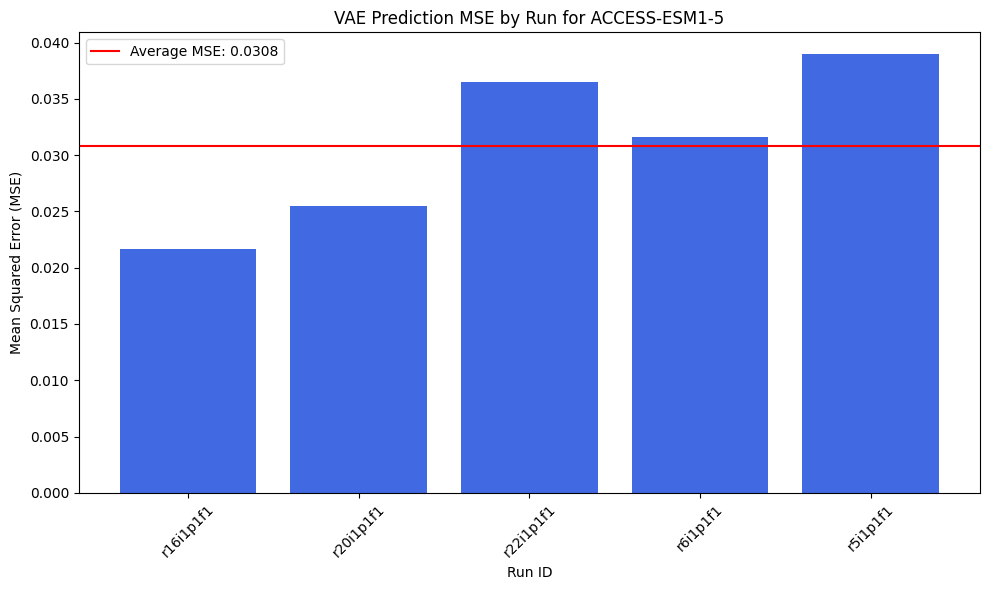

In [19]:
# Plot MSE comparison
plt.figure(figsize=(10, 6))
runs = list(mse_values.keys())
mse_vals = list(mse_values.values())

plt.bar(runs, mse_vals, color='royalblue')
plt.axhline(y=np.mean(mse_vals), color='r', linestyle='-', label=f'Average MSE: {np.mean(mse_vals):.4f}')
plt.title(f'VAE Prediction MSE by Run for {test_model}')
plt.xlabel('Run ID')
plt.ylabel('Mean Squared Error (MSE)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(f"{animation_dir}/vae_mse_comparison_{test_model}.png", dpi=300, bbox_inches='tight')
plt.show()

# Generate New Data Using Latent Space
In this section, we will utilize the latent space and decoder of the trained VAE model to generate new synthetic data.

In [22]:
# Set the VAE model to evaluation mode
vae_model.eval()

# Number of samples to generate
num_samples = 5

# Generate new data
generated_data = vae_model.generate(num_samples).cpu().numpy()

print(f"Generated data shape: {generated_data.shape}")

# Reshape the generated data to the original dimensions
generated_data_reshaped = [data.reshape(vae_model.seq_len, vae_model.feat_dim) for data in generated_data]

# Create a directory for saving animations if it doesn't exist
animation_dir = os.path.join('outputs_vae_trend', 'animations', 'vae_generated')
os.makedirs(animation_dir, exist_ok=True)
print(f"Generated animations will be saved to: {animation_dir}")

# Generate animations for the sampled latent space outputs
for i, data in enumerate(generated_data_reshaped):
    print(f"\nGenerating animation for Generated Sample {i + 1}...")
    
    # Readd nans to grid
    data_with_nans = readd_nans_to_grid(data, nan_mask, predictions=True)
    data_with_nans = data_with_nans.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])
    
    # Create animation
    generated_animation = animate_data(
        data_with_nans,
        title=f'Generated Sample {i + 1}',
        interval=200,
        cmap='viridis',
        color_limits=None
    )
    display(HTML(generated_animation.to_html5_video()))
    generated_animation.save(f"{animation_dir}/vae_generated_sample_{i + 1}.mp4", writer='ffmpeg', fps=15)

print(f"\nAll generated animations have been saved to {animation_dir}")

Generated data shape: (5, 165, 6523)
Generated animations will be saved to: outputs_vae_trend/animations/vae_generated

Generating animation for Generated Sample 1...
Re-adding NaN values to the grid...



Generating animation for Generated Sample 2...
Re-adding NaN values to the grid...



Generating animation for Generated Sample 3...
Re-adding NaN values to the grid...



Generating animation for Generated Sample 4...
Re-adding NaN values to the grid...



Generating animation for Generated Sample 5...
Re-adding NaN values to the grid...



All generated animations have been saved to outputs_vae_trend/animations/vae_generated


## Plot the Time evolution of a single cell of the generated data

Re-adding NaN values to the grid...


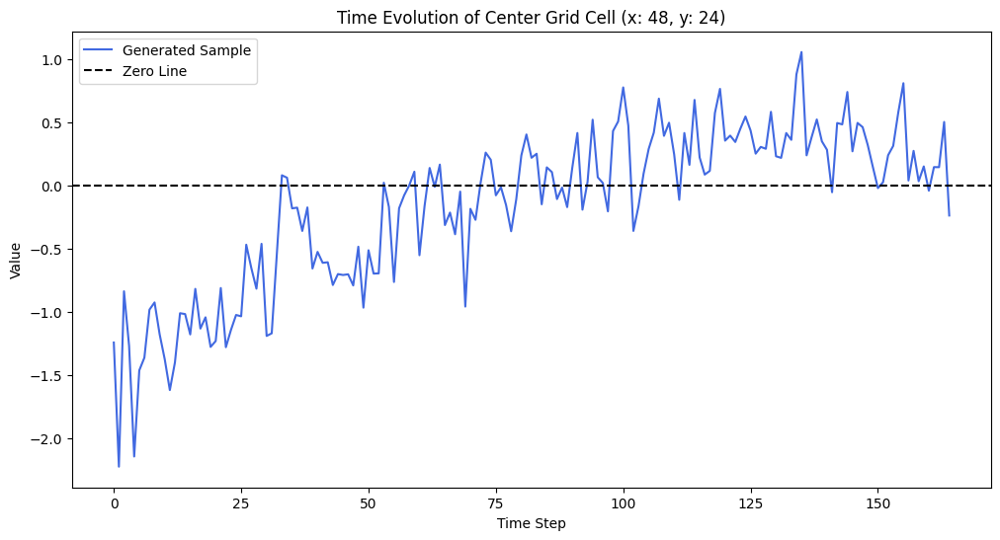

In [21]:
last_generated_sample = generated_data_reshaped[-1]

# Readd the nans to the grid
last_generated_sample_with_nans = readd_nans_to_grid(last_generated_sample, nan_mask, predictions=True)
last_generated_sample_with_nans = last_generated_sample_with_nans.reshape(-1, nan_mask.shape[0], nan_mask.shape[1])

# Plot the time evolution of a single grid cell (close to the center)
center_x, center_y = last_generated_sample_with_nans.shape[1] // 2, last_generated_sample_with_nans.shape[2] // 2  # Get center grid cell indices
random_x, random_y = random.randint(0, last_generated_sample_with_nans.shape[1] - 1), random.randint(0, last_generated_sample_with_nans.shape[2] - 1)  # Random grid cell indices
# time_evolution = last_generated_sample_with_nans[:, center_x, center_y]  # Extract time evolution for the center grid cell
time_evolution = last_generated_sample_with_nans[:, random_x, random_y]  # Extract time evolution for the center grid cell

# Plot the time evolution
plt.figure(figsize=(12, 6))
plt.plot(time_evolution, label='Generated Sample', color='royalblue')
plt.title(f'Time Evolution of Center Grid Cell (x: {random_x}, y: {random_y})')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.axhline(y=0, color='k', linestyle='--', label='Zero Line')
plt.legend()
plt.show()
